# **DIMENSIONALITY REDUCTION WITH PCA: PRINCIPAL COMPONENT ANALYSIS**

# **CONTENTS**

#**1. Introduction to Principal Component Analysis**
#**2.Problem Statement**
#**3. Importing Libraries**
#**4. Data Acquisition & Description**
#**5. Data Pre-Processing**
#**6. Exploratory Data Analysis**
#**7. Data Post Processing**
#**8. Model Development and Evaluation**
#**9. Conclusion**

________________________________________________________________________________

# **1. Introduction**

________________________________________________________________________________


As the number of features or dimensions in a dataset increases, the amount of data required to obtain a statistically significant result increases exponentially. This can lead to issues such as overfitting, increased computation time, and reduced accuracy of machine learning models this is known as the curse of dimensionality problems that arise while working with high-dimensional data.

As the number of dimensions increases, the number of possible combinations of features increases exponentially, which makes it computationally difficult to obtain a representative sample of the data and it becomes expensive to perform tasks such as clustering or classification because it becomes. Additionally, some machine learning algorithms can be sensitive to the number of dimensions, requiring more data to achieve the same level of accuracy as lower-dimensional data.

To address the curse of dimensionality, Feature engineering techniques are used which include feature selection and feature extraction. Dimensionality reduction is a type of feature extraction technique that aims to reduce the number of input features while retaining as much of the original information as possible.

Principal Component Analysis(PCA)  works on the condition that while the data in a higher dimensional space is mapped to data in a lower dimension space, the variance of the data in the lower dimensional space should be maximum.

Principal Component Analysis (PCA) is a statistical procedure that uses an orthogonal transformation that converts a set of correlated variables to a set of uncorrelated variables.PCA is the most widely used tool in exploratory data analysis and in machine learning for predictive models. Moreover,
Principal Component Analysis (PCA) is an unsupervised learning algorithm technique used to examine the interrelations among a set of variables. It is also known as a general factor analysis where regression determines a line of best fit.
The main goal of Principal Component Analysis (PCA) is to reduce the dimensionality of a dataset while preserving the most important patterns or relationships between the variables without any prior knowledge of the target variables.
Principal Component Analysis (PCA) is used to reduce the dimensionality of a data set by finding a new set of variables, smaller than the original set of variables, retaining most of the sample’s information, and useful for the regression and classification of data.

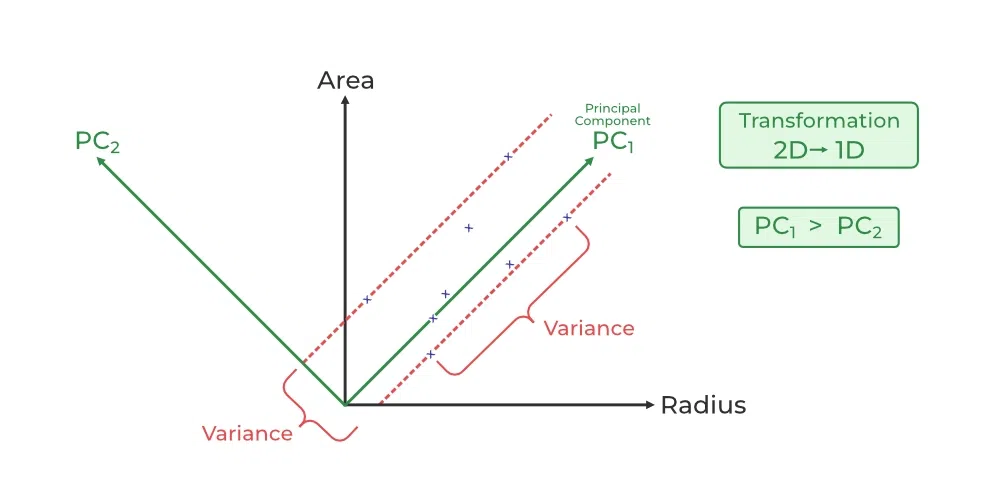



* Principal Component Analysis (PCA) is a technique for dimensionality reduction that identifies a set of orthogonal axes, called principal components, that capture the maximum variance in the data. The principal components are linear combinations of the original variables in the dataset and are ordered in decreasing order of importance. The total variance captured by all the principal components is equal to the total variance in the original dataset.

* The first principal component captures the most variation in the data, but the second principal component captures the maximum variance that is orthogonal to the first principal component, and so on.

* Principal Component Analysis can be used for a variety of purposes, including data visualization, feature selection, and data compression. In data visualization, PCA can be used to plot high-dimensional data in two or three dimensions, making it easier to interpret. In feature selection, PCA can be used to identify the most important variables in a dataset. In data compression, PCA can be used to reduce the size of a dataset without losing important information.

* n Principal Component Analysis, it is assumed that the information is carried in the variance of the features, that is, the higher the variation in a feature, the more information that features carries.
Overall, PCA is a powerful tool for data analysis and can help to simplify complex datasets, making them easier to understand and work with.

<a name = Section14></a>
### **Advantages and Disadvantages of PCA**

|No.|Advantages|Disadvantages
|:--:|:--:|:--:|
|1|**Removes Correlated Features**|**Independent variables become less interpretable**|
|2|**Improves Algorithm Performance**|**Data standardization is must before PCA**|
|3|**Reduces Overfitting**|**Information Loss**|
|4|**Improves Visualization**|**Relies on linear asumptions**|

---
<a name = Section2></a>
# **2. Problem Statement**
---

- According to Epsilon's research, **80% of customers** are more **likely** to do business with you if you provide **personalized service**.

- The **digitization** of everyday lives means that customers expect services to be delivered in a personalized and timely manner.

- **Santander Group** aims to recognize that there is a need to **provide** a **customer** a financial service.

- They intend to determine the **amount** and **value** of the customer's **transaction**.

- This means **anticipating** customer **needs** in a more concrete, but also **simple** and **personal** way.

<center><img width=65% src="https://images.ctfassets.net/3viuren4us1n/60dMABV8cLyUAlwyHdT3SY/ef5a44a5a95c4d280f31a6b4e0fba218/Personalized-Customer-Service.jpg"></center>

- Santander Group is asking **you**, their data scientist, to help them **identify** the value of **transactions** for each **potential customer**.

- This is the first step that they need to nail in order to personalize their services at scale.

- You are provided with an **anonymized dataset** containing **numeric features**, a **numeric target feature**, and a **string ID feature**.

- Every **column** represents a **unique** **category** of transactions and is kept anonymized.

- These transactions can be **shopping**, **bills**, **loan payment**, **subscriptions**, etc.

- The task is to **predict** the value of the **target feature** in the test set.


---
<a name = Section3></a>
# **3. Importing Libraries**
---

In [34]:
#-------------------------------------------------------------------------------------------------------------------------------
import pandas as pd                                                 # Importing for panel data analysis
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high
pd.set_option('display.max_colwidth', None)                         # Unfolding the max feature width for better clearity
pd.set_option('display.max_rows', None)                             # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
pd.set_option('display.float_format', lambda x: '%.5f' % x)         # To suppress scientific notation over exponential values
#-------------------------------------------------------------------------------------------------------------------------------
import numpy as np                                                  # Importing package numpys (For Numerical Python)
#-------------------------------------------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt                                     # Importing pyplot interface using matplotlib
import seaborn as sns                                               # Importin seaborm library for interactive visualization
import plotly.graph_objs as go                                      # Importing plotly for interactive visualizations
%matplotlib inline
#-------------------------------------------------------------------------------------------------------------------------------
from sklearn.preprocessing import StandardScaler                    # Importing to scale the features in the dataset
from sklearn.model_selection import train_test_split                # To properly split the dataset into train and test sets
from sklearn.ensemble import RandomForestRegressor                  # To create a random forest regressor model
from sklearn.linear_model import LinearRegression                   # To create a linear regression model
from sklearn import metrics                                         # Importing to evaluate the model used for regression
from sklearn.decomposition import PCA                               # Importing to create an instance of PCA model
#-------------------------------------------------------------------------------------------------------------------------------
from random import randint                                          # Importing to generate random integers
#-------------------------------------------------------------------------------------------------------------------------------
import time                                                         # For time functionality
import warnings                                                     # Importing warning to disable runtime warnings
warnings.filterwarnings("ignore")                                   # Warnings will appear only once

---
<a name = Section4></a>
# **4. Data Acquisition & Description**
---


In [35]:
value = pd.read_csv(filepath_or_buffer="https://raw.githubusercontent.com/insaid2018/pca-file/master/train.csv")


In [36]:
value.shape

(4459, 4993)

In [38]:
print("shape opf the dataset:', value.shape)]")

shape opf the dataset:', value.shape)]


In [39]:
value.head()

ID         target  48df886f9  0deb4b6a8  34b15f335  a8cb14b00  \
0  000d6aaf2 38000000.00000    0.00000          0    0.00000          0   
1  000fbd867   600000.00000    0.00000          0    0.00000          0   
2  0027d6b71 10000000.00000    0.00000          0    0.00000          0   
3  0028cbf45  2000000.00000    0.00000          0    0.00000          0   
4  002a68644 14400000.00000    0.00000          0    0.00000          0   

   2f0771a37  30347e683  d08d1fbe3  6ee66e115     20aa07010  dc5a8f1d8  \
0          0          0          0          0       0.00000    0.00000   
1          0          0          0          0 2200000.00000    0.00000   
2          0          0          0          0       0.00000    0.00000   
3          0          0          0          0       0.00000    0.00000   
4          0          0          0          0 2000000.00000    0.00000   

   11d86fa6a  77c9823f2  8d6c2a0b2  4681de4fd  adf119b9a  cff75dd09  \
0    0.00000          0          0          0          0    0.00000   
1    0.00000          0          0          0          0    0.00000   
2    0.00000          0          0          0          0    0.00000   
3    0.00000          0          0          0          0    0.00000   
4    0.00000          0          0          0          0    0.00000   

   96f83a237  b8a716ebf  6c7a4567c  4fcfd2b4d  f3b9c0b95  71cebf11c  \
0          0    0.00000          0          0    0.00000          0   
1          0    0.00000          0          0    0.00000          0   
2          0    0.00000          0          0    0.00000          0   
3          0    0.00000          0          0    0.00000          0   
4          0    0.00000          0          0    0.00000          0   

   d966ac62c  68b647452  c88d108c9  ff7b471cd  d5308d8bc  0d866c3d7  \
0          0    0.00000          0          0          0    0.00000   
1          0    0.00000          0          0          0    0.00000   
2          0    0.00000          0          0          0    0.00000   
3          0    0.00000          0          0          0    0.00000   
4          0    0.00000          0          0          0    0.00000   

   bc3f77679  bd8f989f1  0eff5bf95  22ed6dba3  92b13ebba  c330f1a67  \
0          0    0.00000          0    0.00000    0.00000          0   
1          0    0.00000          0    0.00000    0.00000          0   
2          0    0.00000          0    0.00000    0.00000          0   
3          0    0.00000          0    0.00000    0.00000          0   
4          0    0.00000          0    0.00000    0.00000          0   

   233c7c17c  2cb4d123e  eeac16933     87ffda550  822e49b95  316b978cd  \
0    0.00000          0          0 1300000.00000    0.00000          0   
1    0.00000          0          0       0.00000    0.00000          0   
2    0.00000          0          0       0.00000    0.00000          0   
3    0.00000          0          0       0.00000    0.00000          0   
4    0.00000          0          0       0.00000    0.00000          0   

   d04e16aed  5d5c5ce6d  ec863cb52  11ad148bd  ea18d720e  408d86ce9  \
0    0.00000          0          0    0.00000    0.00000    0.00000   
1    0.00000          0          0    0.00000    0.00000    0.00000   
2    0.00000          0          0    0.00000    0.00000    0.00000   
3    0.00000          0          0    0.00000    0.00000    0.00000   
4    0.00000          0          0    0.00000    0.00000    0.00000   

   69d8b4020  b0868a049  80b14398e  ecdef52b2  c36bcacc5  151d318cd  \
0          0          0    0.00000    0.00000          0          0   
1          0          0    0.00000    0.00000          0          0   
2          0          0    0.00000    0.00000          0          0   
3          0          0    0.00000    0.00000          0          0   
4          0          0    0.00000    0.00000          0          0   

   ab0cddb90  2d6bd8275      dfdf4b580  c87722678  a8c320153  7df8788e8  \
0          0    0.00000        0

<a name = Section41></a>
### **Data Description**



In [40]:
value.describe()

target      48df886f9     0deb4b6a8      34b15f335  \
count     4459.00000     4459.00000    4459.00000     4459.00000   
mean   5944923.32204    14654.93010    1390.89482    26722.45092   
std    8234311.50163   389329.80935   64283.02450   569965.18305   
min      30000.00000        0.00000       0.00000        0.00000   
25%     600000.00000        0.00000       0.00000        0.00000   
50%    2260000.00000        0.00000       0.00000        0.00000   
75%    8000000.00000        0.00000       0.00000        0.00000   
max   40000000.00000 20000000.00000 4000000.00000 20000000.00000   

           a8cb14b00       2f0771a37      30347e683      d08d1fbe3  \
count     4459.00000      4459.00000     4459.00000     4459.00000   
mean      4530.16371     26409.95739    30708.10585    16865.21642   
std     235912.40680   1514730.15145   577058.97492   751275.59447   
min          0.00000         0.00000        0.00000        0.00000   
25%          0.00000         0.00000        0.00000        0.00000   
50%          0.00000         0.00000        0.00000        0.00000   
75%          0.00000         0.00000        0.00000        0.00000   
max   14800000.00000 100000000.00000 20708000.00000 40000000.00000   

           6ee66e115       20aa07010      dc5a8f1d8       11d86fa6a  \
count     4459.00000      4459.00000     4459.00000      4459.00000   
mean      4669.20834   2569407.36837   155215.83838    195049.99782   
std     187944.88843   9610183.07315  1587814.70602   2397372.08892   
min          0.00000         0.00000        0.00000         0.00000   
25%          0.00000         0.00000        0.00000         0.00000   
50%          0.00000         0.00000        0.00000         0.00000   
75%          0.00000    600000.00000        0.00000         0.00000   
max   10400000.00000 319612000.00000 60000000.00000 100000000.00000   

        77c9823f2     8d6c2a0b2       4681de4fd      adf119b9a      cff75dd09  \
count  4459.00000    4459.00000      4459.00000     4459.00000     4459.00000   
mean      8.52209    3595.87351   2258014.80153   268084.32384    45882.54915   
std     569.06891  124543.50180  15522980.13471  3026909.73663   814067.35576   
min       0.00000       0.00000         0.00000        0.00000        0.00000   
25%       0.00000       0.00000         0.00000        0.00000        0.00000   
50%       0.00000       0.00000         0.00000        0.00000        0.00000   
75%       0.00000       0.00000         0.00000        0.00000        0.00000   
max   38000.00000 6000000.00000 356000000.00000 66000000.00000 31110000.00000   

           96f83a237       b8a716ebf      6c7a4567c     4fcfd2b4d  \
count     4459.00000      4459.00000     4459.00000    4459.00000   
mean     44514.77910    396896.08851    28831.29491    1940.79390   
std    1354504.11192   3238242.60292   570538.76291   27860.22429   
min          0.00000         0.00000        0.00000       0.00000   
25%          0.00000         0.00000        0.00000       0.00000   
50%          0.00000         0.00000        0.00000       0.00000   
75%          0.00000         0.00000        0.00000       0.00000   
max   79600000.00000 100000000.00000 21730000.00000 1100000.00000   

            f3b9c0b95       71cebf11c      d966ac62c      68b647452  \
count      4459.00000      4459.00000     4459.00000     4459.00000   
mean     448384.09210     79897.28639   154839.42588   112825.35951   
std     6370643.86186   2846439.89794  2425793.87231  1161274.58848   
min           0.00000         0.00000        0.00000        0.00000   
25%           0.00000         0.00000        0.00000        0.00000   
50%           0.00000         0.00000        0.00000        0.00000   
75%           0.00000         0.00000        0.00000        0.00000   
max   200000000.00000 153672000.00000 60000000.00000 37200000.00000   

            c88d108c9     ff7b471cd  d5308d8bc      0d866c3d7       bc3f77679  \
count      4459.00000    4459.00000 4459.00000     4459.0

**Observations**:


- The dataset contains __4459 observations__ and __4993 columns__.

- The **target** feature is **numeric** and have an average value of **5944923** units.

- It **ranges** from **300000** units  upto **40000000** units.


###**Data Information**

Here we can see **information about the types of features** in the data set.

In [41]:
value.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4459 entries, 0 to 4458
Columns: 4993 entries, ID to 9fc776466
dtypes: float64(1845), int64(3147), object(1)
memory usage: 169.9+ MB


**Observations**:

- The dataset has **4459** rows, and **4993** features.

- **Out of 4993** features present, **1845** are of **float64** datatype, including the target feature.

- **3147** features have **int64** datatype.

- Only **1 feature** has **object** datatype which is **ID** as seen in the  dataset.

<a name = Section5></a>

---
# **5. Data Pre-Processing**
---

###**Checking for Missing Data**

In [42]:
value.isna().sum().any()

False

There are no missing values in the data set

In [43]:
value.head()

ID         target  48df886f9  0deb4b6a8  34b15f335  a8cb14b00  \
0  000d6aaf2 38000000.00000    0.00000          0    0.00000          0   
1  000fbd867   600000.00000    0.00000          0    0.00000          0   
2  0027d6b71 10000000.00000    0.00000          0    0.00000          0   
3  0028cbf45  2000000.00000    0.00000          0    0.00000          0   
4  002a68644 14400000.00000    0.00000          0    0.00000          0   

   2f0771a37  30347e683  d08d1fbe3  6ee66e115     20aa07010  dc5a8f1d8  \
0          0          0          0          0       0.00000    0.00000   
1          0          0          0          0 2200000.00000    0.00000   
2          0          0          0          0       0.00000    0.00000   
3          0          0          0          0       0.00000    0.00000   
4          0          0          0          0 2000000.00000    0.00000   

   11d86fa6a  77c9823f2  8d6c2a0b2  4681de4fd  adf119b9a  cff75dd09  \
0    0.00000          0          0          0          0    0.00000   
1    0.00000          0          0          0          0    0.00000   
2    0.00000          0          0          0          0    0.00000   
3    0.00000          0          0          0          0    0.00000   
4    0.00000          0          0          0          0    0.00000   

   96f83a237  b8a716ebf  6c7a4567c  4fcfd2b4d  f3b9c0b95  71cebf11c  \
0          0    0.00000          0          0    0.00000          0   
1          0    0.00000          0          0    0.00000          0   
2          0    0.00000          0          0    0.00000          0   
3          0    0.00000          0          0    0.00000          0   
4          0    0.00000          0          0    0.00000          0   

   d966ac62c  68b647452  c88d108c9  ff7b471cd  d5308d8bc  0d866c3d7  \
0          0    0.00000          0          0          0    0.00000   
1          0    0.00000          0          0          0    0.00000   
2          0    0.00000          0          0          0    0.00000   
3          0    0.00000          0          0          0    0.00000   
4          0    0.00000          0          0          0    0.00000   

   bc3f77679  bd8f989f1  0eff5bf95  22ed6dba3  92b13ebba  c330f1a67  \
0          0    0.00000          0    0.00000    0.00000          0   
1          0    0.00000          0    0.00000    0.00000          0   
2          0    0.00000          0    0.00000    0.00000          0   
3          0    0.00000          0    0.00000    0.00000          0   
4          0    0.00000          0    0.00000    0.00000          0   

   233c7c17c  2cb4d123e  eeac16933     87ffda550  822e49b95  316b978cd  \
0    0.00000          0          0 1300000.00000    0.00000          0   
1    0.00000          0          0       0.00000    0.00000          0   
2    0.00000          0          0       0.00000    0.00000          0   
3    0.00000          0          0       0.00000    0.00000          0   
4    0.00000          0          0       0.00000    0.00000          0   

   d04e16aed  5d5c5ce6d  ec863cb52  11ad148bd  ea18d720e  408d86ce9  \
0    0.00000          0          0    0.00000    0.00000    0.00000   
1    0.00000          0          0    0.00000    0.00000    0.00000   
2    0.00000          0          0    0.00000    0.00000    0.00000   
3    0.00000          0          0    0.00000    0.00000    0.00000   
4    0.00000          0          0    0.00000    0.00000    0.00000   

   69d8b4020  b0868a049  80b14398e  ecdef52b2  c36bcacc5  151d318cd  \
0          0          0    0.00000    0.00000          0          0   
1          0          0    0.00000    0.00000          0          0   
2          0          0    0.00000    0.00000          0          0   
3          0          0    0.00000    0.00000          0          0   
4          0          0    0.00000    0.00000          0          0   

   ab0cddb90  2d6bd8275      dfdf4b580  c87722678  a8c320153  7df8788e8  \
0          0    0.00000        0


### **Data Cleaning**

- In this section, we will **remove** columns which are **redundant** for model.

- We will first remove the **ID** column then remove the columns with **standard deviation = 0** from the dataset.

- Standard Deviation = 0 means that **every data point in a column is equal to its mean**.

- Also means that all of a column's values are **identical** and such columns do **not help** us in **prediction** so we will drop them.

In [44]:
value=value.drop("ID", axis=1)

In [45]:
value.head()

target  48df886f9  0deb4b6a8  34b15f335  a8cb14b00  2f0771a37  \
0 38000000.00000    0.00000          0    0.00000          0          0   
1   600000.00000    0.00000          0    0.00000          0          0   
2 10000000.00000    0.00000          0    0.00000          0          0   
3  2000000.00000    0.00000          0    0.00000          0          0   
4 14400000.00000    0.00000          0    0.00000          0          0   

   30347e683  d08d1fbe3  6ee66e115     20aa07010  dc5a8f1d8  11d86fa6a  \
0          0          0          0       0.00000    0.00000    0.00000   
1          0          0          0 2200000.00000    0.00000    0.00000   
2          0          0          0       0.00000    0.00000    0.00000   
3          0          0          0       0.00000    0.00000    0.00000   
4          0          0          0 2000000.00000    0.00000    0.00000   

   77c9823f2  8d6c2a0b2  4681de4fd  adf119b9a  cff75dd09  96f83a237  \
0          0          0          0          0    0.00000          0   
1          0          0          0          0    0.00000          0   
2          0          0          0          0    0.00000          0   
3          0          0          0          0    0.00000          0   
4          0          0          0          0    0.00000          0   

   b8a716ebf  6c7a4567c  4fcfd2b4d  f3b9c0b95  71cebf11c  d966ac62c  \
0    0.00000          0          0    0.00000          0          0   
1    0.00000          0          0    0.00000          0          0   
2    0.00000          0          0    0.00000          0          0   
3    0.00000          0          0    0.00000          0          0   
4    0.00000          0          0    0.00000          0          0   

   68b647452  c88d108c9  ff7b471cd  d5308d8bc  0d866c3d7  bc3f77679  \
0    0.00000          0          0          0    0.00000          0   
1    0.00000          0          0          0    0.00000          0   
2    0.00000          0          0          0    0.00000          0   
3    0.00000          0          0          0    0.00000          0   
4    0.00000          0          0          0    0.00000          0   

   bd8f989f1  0eff5bf95  22ed6dba3  92b13ebba  c330f1a67  233c7c17c  \
0    0.00000          0    0.00000    0.00000          0    0.00000   
1    0.00000          0    0.00000    0.00000          0    0.00000   
2    0.00000          0    0.00000    0.00000          0    0.00000   
3    0.00000          0    0.00000    0.00000          0    0.00000   
4    0.00000          0    0.00000    0.00000          0    0.00000   

   2cb4d123e  eeac16933     87ffda550  822e49b95  316b978cd  d04e16aed  \
0          0          0 1300000.00000    0.00000          0    0.00000   
1          0          0       0.00000    0.00000          0    0.00000   
2          0          0       0.00000    0.00000          0    0.00000   
3          0          0       0.00000    0.00000          0    0.00000   
4          0          0       0.00000    0.00000          0    0.00000   

   5d5c5ce6d  ec863cb52  11ad148bd  ea18d720e  408d86ce9  69d8b4020  \
0          0          0    0.00000    0.00000    0.00000          0   
1          0          0    0.00000    0.00000    0.00000          0   
2          0          0    0.00000    0.00000    0.00000          0   
3          0          0    0.00000    0.00000    0.00000          0   
4          0          0    0.00000    0.00000    0.00000          0   

   b0868a049  80b14398e  ecdef52b2  c36bcacc5  151d318cd  ab0cddb90  \
0          0    0.00000    0.00000          0          0          0   
1          0    0.00000    0.00000          0          0          0   
2          0    0.00000    0.00000          0          0          0   
3          0    0.00000    0.00000          0          0          0   
4          0    0.00000    0.00000          0          0          0   

   2d6bd8275      dfdf4b580  c87722678  a8c320153  7df8788e8  a04684f1f  \
0    0.00000        0.00000     

In [46]:
value.dtypes.value_counts()

int64      3147
float64    1845
dtype: int64

In [47]:
value.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4459 entries, 0 to 4458
Columns: 4992 entries, target to 9fc776466
dtypes: float64(1845), int64(3147)
memory usage: 169.8 MB


In [48]:
pd.set_option('display.max_rows',200)
pd.set_option('display.max_columns',200)


In [49]:
value.head(200)

,target,48df886f9,0deb4b6a8,34b15f335,a8cb14b00,2f0771a37,30347e683,d08d1fbe3,6ee66e115,20aa07010,dc5a8f1d8,11d86fa6a,77c9823f2,8d6c2a0b2,4681de4fd,adf119b9a,cff75dd09,96f83a237,b8a716ebf,6c7a4567c,4fcfd2b4d,f3b9c0b95,71cebf11c,d966ac62c,68b647452,c88d108c9,ff7b471cd,d5308d8bc,0d866c3d7,bc3f77679,bd8f989f1,0eff5bf95,22ed6dba3,92b13ebba,c330f1a67,233c7c17c,2cb4d123e,eeac16933,87ffda550,822e49b95,316b978cd,d04e16aed,5d5c5ce6d,ec863cb52,11ad148bd,ea18d720e,408d86ce9,69d8b4020,b0868a049,80b14398e,ecdef52b2,c36bcacc5,151d318cd,ab0cddb90,2d6bd8275,dfdf4b580,c87722678,a8c320153,7df8788e8,a04684f1f,fa977f17b,feed9d437,645b47cde,7298ca1ef,d80abf8bc,654dd8a3b,7fc39583c,8c94b6675,e421c414e,5b91580ee,964335fdf,5a86cabd0,6cb207ac9,c1bc828da,e90ed19da,c4d38135f,968b01ca3,26b423c42,0656586a4,b4ced4b7a,0b8e10df6,603e85eb7,605728195,4e8196700,f115e74c0,9ca0eee11,472cd130b,ee7e4581d,3e0e55648,a939664aa,b0f5ed414,a72e0bf30,e662f1672,54b1c1bc0,ec1425047,78a879b5d,bd550871c,828b327a6,3268914c7,21e0e6ae3,...,e369704a1,7df9efba5,f5723deba,7fd35c77a,9d9e518a3,99258443a,1d81e197a,831a9e087,de471ea65,8781e4b91,dc5ba677f,df3ac443c,79203fbab,f1ab19e7a,300398f1c,6eefca12e,22bf44001,19915a6d3,20a325694,8afae1db8,c283d4609,11114a47a,b961b0d59,103b8a033,43d70cc4d,09184c121,08c089775,572d36d31,1de239e78,d7568383a,8d7bfb911,5964f1856,6c7bf200b,b3058e9ba,108fe14ef,dcfcddf16,5fad07863,b904b8345,408021ef8,ef30f6be5,e29d22b59,a19b05919,e849e3ae0,05f11f48f,49f11e712,c959d372a,b625fe55a,f642213a6,6df033973,1834f29f5,31e434a58,e431708ff,fb42abc0d,88263a031,ab7764ead,a380d5301,46ee7f2c8,2e1287e41,23310aa6f,9dc52515a,969caa87a,00302fe51,1189ee335,ca04a07ca,f6f15ffa5,841704460,ea5ed6ff7,b1bb8eac3,8132d18b8,c24ea6548,cdfc2b069,2a879b4f7,6b119d8ce,98dea9e42,9f2471031,88458cb21,f40da20f4,7ad6b38bd,c901e7df1,8f55955dc,85dcc913d,5ca0b9b0c,eab8abf7a,8d8bffbae,2a1f6c7f9,9437d8b64,5831f4c76,2e84e09c5,d45fd5508,a165f5761,3ecc09859,9281abeea,8675bec0b,3a13ed79a,f677d4d13,71b203550,137efaa80,fb36b89d9,7e293fbaf,9fc776466
0,38000000.00000,0.00000,0,0.00000,0,0,0,0,0,0.00000,0.00000,0.00000,0,0,0,0,0.00000,0,0.00000,0,0,0.00000,0,0,0.00000,0,0,0,0.00000,0,0.00000,0,0.00000,0.00000,0,0.00000,0,0,1300000.00000,0.00000,0,0.00000,0,0,0.00000,0.00000,0.00000,0,0,0.00000,0.00000,0,0,0,0.00000,0.00000,0,0,0,0,0.00000,0.00000,0,0,0,0,0,0.00000,0,0,0,0,0,0,0,0,0,0,0.00000,0.00000,0,0,0,0.00000,0.00000,0.00000,0.00000,0,0.00000,0,0.00000,0,0,0.00000,0.00000,0,0,0.00000,0,0.00000,...,0,0,0,0,0,0,0.00000,0,0,1266666.66000,0,0,0,0,0.00000,0,0,0.00000,0,0,0,0.00000,0.00000,0,0,0.00000,0,0,0,0.00000,0.00000,0,0,0,0.00000,0.00000,0.00000,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0,0,0,0,0,0.00000,0,0,0,1100000.00000,0,0,0,0.00000,0.00000,14800000,0.00000,1200000.00000,0.00000,0.00000,0,0,0,0,0.00000,4000000,0,0.00000,0,0,0.00000,0,0,0.00000,0,0,0.00000,0.00000,0.00000,0.00000,0,0,0,0,0,0,0
1,600000.00000,0.00000,0,0.00000,0,0,0,0,0,2200000.00000,0.00000,0.00000,0,0,0,0,0.00000,0,0.00000,0,0,0.00000,0,0,0.00000,0,0,0,0.00000,0,0.00000,0,0.00000,0.00000,0,0.00000,0,0,0.00000,0.00000,0,0.00000,0,0,0.00000,0.00000,0.00000,0,0,0.00000,0.00000,0,0,0,0.00000,24000000.00000,0,0,0,0,0.00000,0.00000,0,0,0,0,0,0.00000,0,0,0,0,0,0,0,0,0,0,0.00000,0.00000,0,0,0,0.00000,0.00000,0.00000,0.00000,0,0.00000,0,0.00000,0,0,0.00000,0.00000,0,0,0.00000,0,0.00000,...,0,0,0,0,0,0,0.00000,0,0,0.00000,0,0,0,0,0.00000,0,0,0.00000,0,0,0,0.00000,0.00000,0,0,0.00000,0,0,0,0.00000,0.00000,0,0,0,0.00000,0.00000,0.00000,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0,0,0,0,0,0.00000,0,0,0,0.00000,0,0,0,0.00000,0.00000,0,0.00000,0.00000,0.00000,0.00000,0,0,0,0,0.00000,0,0,0.00000,0,0,0.00000,0,0,0.00000,0,0,0.00000,0.00000,0.00000,0.00000,0,0,0,0,0,0,0
2,10000000.00000,0.00000,0,0.00000,0,0,0,0,0,0.00000,0.00000,0.00000,0,0,0,0,0.00000,0,0.00000,0,0,0.00000,0,0,0.00000,0,0,0,0.00000,0,0.00000,0,0.00000,0.00000,0,0.00000,0,0,0

###**Feature Scaling**

Now we will standardize the columns of the dataframe using StandardScaler.

In [50]:
# Instantiating a standard scaler object
scaler = StandardScaler()

# Transforming our data
scaled_arr = scaler.fit_transform(value)

# Inputting our transformed data in a dataframe
scaled_frame = pd.DataFrame(data=scaled_arr, columns=value.columns)

# Getting a glimpse of transformed data
scaled_frame.head()


,target,48df886f9,0deb4b6a8,34b15f335,a8cb14b00,2f0771a37,30347e683,d08d1fbe3,6ee66e115,20aa07010,dc5a8f1d8,11d86fa6a,77c9823f2,8d6c2a0b2,4681de4fd,adf119b9a,cff75dd09,96f83a237,b8a716ebf,6c7a4567c,4fcfd2b4d,f3b9c0b95,71cebf11c,d966ac62c,68b647452,c88d108c9,ff7b471cd,d5308d8bc,0d866c3d7,bc3f77679,bd8f989f1,0eff5bf95,22ed6dba3,92b13ebba,c330f1a67,233c7c17c,2cb4d123e,eeac16933,87ffda550,822e49b95,316b978cd,d04e16aed,5d5c5ce6d,ec863cb52,11ad148bd,ea18d720e,408d86ce9,69d8b4020,b0868a049,80b14398e,ecdef52b2,c36bcacc5,151d318cd,ab0cddb90,2d6bd8275,dfdf4b580,c87722678,a8c320153,7df8788e8,a04684f1f,fa977f17b,feed9d437,645b47cde,7298ca1ef,d80abf8bc,654dd8a3b,7fc39583c,8c94b6675,e421c414e,5b91580ee,964335fdf,5a86cabd0,6cb207ac9,c1bc828da,e90ed19da,c4d38135f,968b01ca3,26b423c42,0656586a4,b4ced4b7a,0b8e10df6,603e85eb7,605728195,4e8196700,f115e74c0,9ca0eee11,472cd130b,ee7e4581d,3e0e55648,a939664aa,b0f5ed414,a72e0bf30,e662f1672,54b1c1bc0,ec1425047,78a879b5d,bd550871c,828b327a6,3268914c7,21e0e6ae3,...,e369704a1,7df9efba5,f5723deba,7fd35c77a,9d9e518a3,99258443a,1d81e197a,831a9e087,de471ea65,8781e4b91,dc5ba677f,df3ac443c,79203fbab,f1ab19e7a,300398f1c,6eefca12e,22bf44001,19915a6d3,20a325694,8afae1db8,c283d4609,11114a47a,b961b0d59,103b8a033,43d70cc4d,09184c121,08c089775,572d36d31,1de239e78,d7568383a,8d7bfb911,5964f1856,6c7bf200b,b3058e9ba,108fe14ef,dcfcddf16,5fad07863,b904b8345,408021ef8,ef30f6be5,e29d22b59,a19b05919,e849e3ae0,05f11f48f,49f11e712,c959d372a,b625fe55a,f642213a6,6df033973,1834f29f5,31e434a58,e431708ff,fb42abc0d,88263a031,ab7764ead,a380d5301,46ee7f2c8,2e1287e41,23310aa6f,9dc52515a,969caa87a,00302fe51,1189ee335,ca04a07ca,f6f15ffa5,841704460,ea5ed6ff7,b1bb8eac3,8132d18b8,c24ea6548,cdfc2b069,2a879b4f7,6b119d8ce,98dea9e42,9f2471031,88458cb21,f40da20f4,7ad6b38bd,c901e7df1,8f55955dc,85dcc913d,5ca0b9b0c,eab8abf7a,8d8bffbae,2a1f6c7f9,9437d8b64,5831f4c76,2e84e09c5,d45fd5508,a165f5761,3ecc09859,9281abeea,8675bec0b,3a13ed79a,f677d4d13,71b203550,137efaa80,fb36b89d9,7e293fbaf,9fc776466
0,3.89330,-0.03765,-0.02164,-0.04689,-0.01920,-0.01744,-0.05322,-0.02245,-0.02485,-0.26739,-0.09777,-0.08137,-0.01498,-0.02888,-0.14548,-0.08858,-0.05637,-0.03287,-0.12258,-0.05054,-0.06967,-0.07039,-0.02807,-0.06384,-0.09717,-0.04180,-0.02571,0.00000,-0.10655,-0.02470,-0.19546,-0.02673,-0.19099,-0.13110,0.00000,-0.10926,-0.09053,0.00000,0.00685,-0.14793,-0.06420,-0.13426,-0.06081,-0.03454,-0.07245,-0.05898,-0.09976,-0.05401,-0.05250,-0.13700,-0.07379,-0.01506,-0.04865,-0.03281,-0.10308,-0.07601,-0.02126,-0.03911,0.00000,-0.05408,-0.03187,-0.12426,-0.10704,-0.07546,-0.03189,-0.06812,-0.04375,-0.16983,-0.04865,0.00000,-0.03103,-0.04858,-0.04542,-0.02192,-0.01498,-0.03950,-0.02494,-0.05801,-0.07197,-0.08744,-0.10397,-0.01681,-0.05783,-0.10932,-0.09771,-0.13927,-0.09680,-0.04789,-0.08194,-0.05016,-0.07202,-0.07040,-0.05823,-0.13368,-0.12578,-0.02825,-0.07316,-0.11784,-0.06368,-0.10233,...,-0.07736,-0.05882,-0.07469,-0.04155,-0.01997,-0.01498,-0.11703,-0.07442,-0.02365,-0.04874,-0.01498,-0.04043,-0.01762,-0.01498,-0.11728,-0.07711,-0.01498,-0.17996,-0.09881,-0.08131,-0.08516,-0.14073,-0.08842,-0.02358,0.00000,-0.09036,-0.09695,-0.01498,-0.06729,-0.11516,-0.14133,-0.02768,-0.01498,-0.04682,-0.04294,-0.08901,-0.07135,-0.04814,0.00000,-0.20766,0.00000,-0.12356,-0.02998,-0.10615,-0.06545,-0.04316,-0.13633,-0.10847,-0.17604,-0.12938,-0.03424,-0.13618,-0.08964,-0.03874,-0.05214,-0.02164,-0.06454,-0.09703,-0.26941,-0.01731,-0.01610,-0.04859,0.06917,-0.07824,-0.01947,-0.06865,-0.15427,-0.13115,1.89756,-0.12774,0.09850,-0.10983,-0.13663,-0.01683,-0.01498,-0.03522,-0.02505,-0.08655,0.31027,-0.03680,-0.06299,-0.01498,-0.10815,-0.11792,-0.05786,-0.10384,-0.18141,-0.01498,-0.02902,-0.09653,-0.11496,-0.10040,-0.17852,-0.11425,-0.01498,-0.02572,-0.02213,-0.07234,-0.05636,-0.12585
1,-0.64918,-0.03765,-0.02164,-0.04689,-0.01920,-0.01744,-0.05322,-0.02245,-0.02485,-0.03844,-0.09777,-0.08137,-0.01498,-0.02888,-0.14548,-0.08858,-0.05637,-0.03287,-0.12258,-0.05054,-0.06967,-0.07039,-0.028


### **Data Splitting**

- Now we will split our data into train set and test set.

- We will keep **80%** data in the **train** set, and **20%** data in the **test** set.

In [51]:
X = scaled_frame.drop(labels=['target'], axis=1)
y = scaled_frame['target']


In [52]:
# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Display the shape of training and testing data
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)


X_train shape:  (3567, 4991)
y_train shape:  (3567,)
X_test shape:  (892, 4991)
y_test shape:  (892,)


#**MODEL DEVELOPMENT AND EVALUATION WITHOUT PCA**

In [53]:
import numpy as np

In [54]:
clfs = [LinearRegression(), RandomForestRegressor(random_state=42)]

for clf in clfs:

  # Extracting model name
  model_name = type(clf).__name__

  # Train the model
  clf.fit(X_train, y_train)

  # Make predictions on the trained model
  predictions = clf.predict(X_test)

  # Estimating the model performance
  RMSE = np.sqrt(metrics.mean_squared_error(y_test, predictions))
  R_squared = metrics.r2_score(y_test, predictions)

  # Display the metrics and time took to develop the model
  print('Performance Metrics of', model_name, ':')
  print('[RMSE]:', RMSE, '[R-Squared]:', R_squared)


Performance Metrics of LinearRegression :
[RMSE]: 4282004601.557865 [R-Squared]: -2.191772936329418e+19
Performance Metrics of RandomForestRegressor :
[RMSE]: 0.8126975960386158 [R-Squared]: 0.2104870627303903


**Observations**:


- Our linear regression model is giving weird **RMSE** & **R-squared** scores.

- Our random forest model is giving an RMSE score of 0.81 & R-squared of 0.21.


In [24]:
pca = PCA(n_components=600, random_state=0)

X_pca_train = pca.fit_transform(X_train)
X_pca_test = pca.transform(X_test)

# Printing shape of X_train and X_test
print('Shape of X_train: ', X_pca_train.shape)
print('Shape of X_test: ', X_pca_test.shape)


Shape of X_train:  (3567, 600)
Shape of X_test:  (892, 600)


In [25]:
fig.show()

#**MODEL DEVELOPMENT AND EVALUATION WITH PCA**


- Since there are a **lot of features used** to fit the model, it becomes a **tedious** task for the model to **assess every feature**.

- We will use the **dimensionality reduction** technique - **Principle Component Analysis**.

- PCA will **reduce** the number of **features** used to fit the model.

- We will directly **perform PCA** on our **already standardized features** stored in **X**.

- We are aiming to **retain 80%** of the **variance** from the data.

In [26]:
clfs = [LinearRegression(), RandomForestRegressor(random_state=42)]

for clf in clfs:

  # Extracting model name
  model_name = type(clf).__name__

  # Train the model
  clf.fit(X_pca_train, y_train)

  # Make predictions on the trained model
  predictions = clf.predict(X_pca_test)

  # Estimating the model performance
  RMSE = np.sqrt(metrics.mean_squared_error(y_test, predictions))
  R_squared = metrics.r2_score(y_test, predictions)

  # Display the metrics and time took to develop the model
  print('Performance Metrics of', model_name, ':')
  print('[RMSE]:', RMSE, '[R-Squared]:', R_squared)


Performance Metrics of LinearRegression :
[RMSE]: 0.838918473142915 [R-Squared]: 0.15871951228808645
Performance Metrics of RandomForestRegressor :
[RMSE]: 0.7952952393021275 [R-Squared]: 0.24393685901704254


In [29]:
fig.show()

**Observations**:


- Our linear regression model is giving an **RMSE** of **0.83** & **R-squared** score of **0.16**.

- Our random forest model is giving an **RMSE** score of **0.79** & **R-squared** score of **0.24**.

- But, such **scores** are to be **expected** since we are only using **600 features** from our dataset.


<a name = Section84></a>
### **Difference between the models**

|#|Model Name|RMSE|R-Squared|
|:--:|:--:|:--:|:--:|
|1|Linear Regression without PCA|4282004601.557865 |-2.191772936329418e+19|
|2|Random Forest without PCA|0.8126975960386158 |0.2104870627303903|
|3|Linear Regression with PCA|0.838918473142915 |0.15871951228808645|
|4|Random Forest with PCA|0.7952952393021275|0.24393685901704254|

- Applying PCA on the dataset amounts to **99% faster** training for the linear regression model.

- The second random forest model is about **67% faster** to train than the first model.

- The models are trained significantly **faster** with **less performance compromise** than the models trained before performing PCA.

#### **NOTE**:

- We are **not scaling** back the **target variable** to it's original scale here.

- Our goal was to **learn** how to apply **PCA** to our data before training **affects** the performance.

- The **goal is achieved**.



---
# **Conclusion**
---

- We studied **PCA** and its usage.

- We  learned about how to use PCA on a dataset.

- Without PCA, it took **longer** to train our ML models.

- But after applying PCA to the dataset, our models trained much **faster**.
